<a href="https://colab.research.google.com/github/Manas-Kumar-Muduli/social-distancing-using-yolov3/blob/master/I_darknet_YOLOv3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


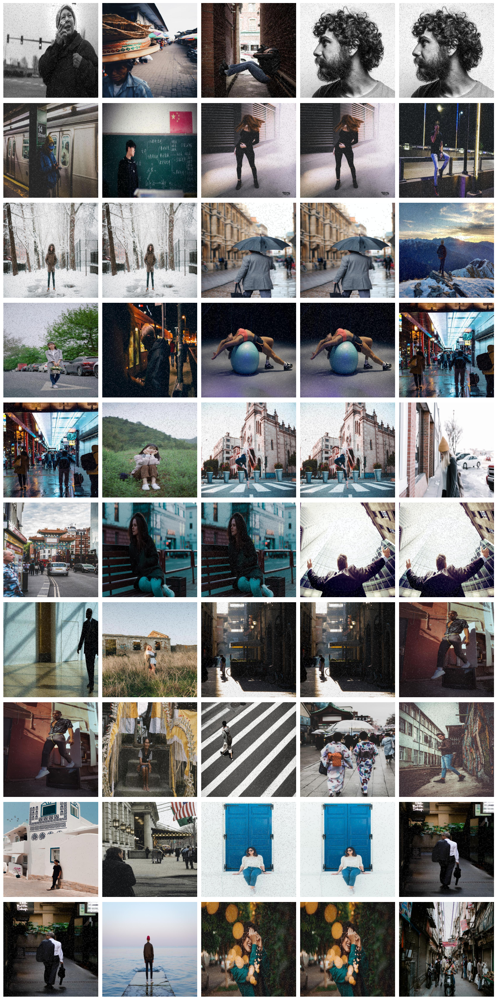

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

folder_path = '/content/drive/MyDrive/Dataset/People-detection-2/People-detection-2/train'
files = os.listdir(folder_path)
image_files = [f for f in files if f.endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

image_files = image_files[:50]
fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(15, 30))

axes = axes.flatten()

for ax, image_file in zip(axes, image_files):
    img = Image.open(os.path.join(folder_path, image_file))
    ax.imshow(img)
    ax.axis('off')

for ax in axes[len(image_files):]:
    fig.delaxes(ax)

plt.tight_layout()
plt.show()


In [ ]:
%cd /content/drive/MyDrive/YOLOv3

/content/drive/MyDrive/YOLOv3


In [ ]:
!git clone https://github.com/AlexeyAB/darknet


Cloning into 'darknet'...
remote: Enumerating objects: 15833, done.
remote: Total 15833 (delta 0), reused 0 (delta 0), pack-reused 15833
Receiving objects: 100% (15833/15833), 14.35 MiB | 8.59 MiB/s, done.
Resolving deltas: 100% (10670/10670), done.
Updating files: 100% (2056/2056), done.


In [ ]:
%cd /content/drive/MyDrive/YOLOv3/darknet

/content/drive/MyDrive/YOLOv3/darknet


In [ ]:
!make

chmod +x *.sh


In [ ]:
!chmod +x ./darknet

In [ ]:
%cd /content/drive/MyDrive/YOLOv3/custom_weight

/content/drive/MyDrive/YOLOv3/custom_weight


!wget https://pjreddie.com/media/files/darknet53.conv.74


In [ ]:
%cd /content/drive/MyDrive/YOLOv3/darknet

/content/drive/MyDrive/YOLOv3/darknet


In [ ]:
!./darknet detector train /content/drive/MyDrive/Dataset/People-detection-2/People-detection-2/obj1.data /content/drive/MyDrive/YOLOv3/darknet/cfg/yolov3.cfg /content/drive/MyDrive/YOLOv3/custom_weight/darknet53.conv.74


Streaming output truncated to the last 5000 lines.
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 94 Avg (IOU: 0.166108), count: 4, class_loss = 1501.402222, iou_loss = 26.417725, total_loss = 1527.819946 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 106 Avg (IOU: 0.000000), count: 1, class_loss = 4844.520020, iou_loss = 0.000000, total_loss = 4844.520020 
 total_bbox = 1617, rewritten_bbox = 0.556586 % 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 82 Avg (IOU: 0.332413), count: 1, class_loss = 312.949158, iou_loss = 2.427124, total_loss = 315.376282 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 94 Avg (IOU: 0.000000), count: 1, class_loss = 1410.091309, iou_loss = 0.000000, total_loss = 1410.091309 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 106 Avg (IOU: 0.000000), count: 1, class_loss = 4859.162598, iou_loss = 0.000000, total_loss = 4859.162598 
 total_bbox = 1618, rewritten

**DETECT**

In [ ]:
# importing required libraries

import cv2 as cv
from scipy.spatial import distance as dist
import numpy as np
import argparse
import imutils
import os

In [ ]:
# base path to YOLO directory
MODEL_PATH = "/content/drive/MyDrive/yolo-coco"

# initialize minimum probability to filter weak detections along with the
# threshold when applying non-maxim suppression
MIN_CONF = 0.3
NMS_THRESH = 0.3

# define the minimum safe distance (in pixels) that two people can be from each other
MIN_DISTANCE = 50

In [ ]:
# load the COCO class labels our YOLO model was trained on
labelsPath = os.path.sep.join([MODEL_PATH, "coco.names"])
LABELS = open(labelsPath).read().strip().split("\n")

print(LABELS)

print(len(LABELS))

# derive the paths to the YOLO weights and model configuration
weightsPath = os.path.sep.join([MODEL_PATH, "yolov3.weights"])
configPath = os.path.sep.join([MODEL_PATH, "yolov3.cfg"])

# load our YOLO object detector trained on COCO dataset (80 classes)
print("[INFO] loading YOLO from disk...")
net = cv.dnn.readNetFromDarknet(configPath, weightsPath)

['people']
1
[INFO] loading YOLO from disk...


In [ ]:
FLAGS = []

if __name__ == '__main__':
    parser = argparse.ArgumentParser()


    parser.add_argument('-w', '--weights',
        default='/content/drive/MyDrive/yolo-coco/yolov3.weights')

    parser.add_argument('-cfg', '--config',
        default='/content/drive/MyDrive/yolo-coco/yolov3.cfg')

    parser.add_argument('-v', '--video-path',
        default='/content/drive/MyDrive/Dataset/People-detection-2/People-detection-2/input1.mp4')

    parser.add_argument('-vo', '--video-output-path',
        default='output_file.avi')

    parser.add_argument('-d', '--display',
        default=1)
    parser.add_argument('-l', '--labels',
        default='/content/drive/MyDrive/yolo-coco/coco.names')


    FLAGS, unparsed = parser.parse_known_args()


# Get the labels
    LABELS = open(FLAGS.labels).read().strip().split('\n')


# Load the weights and configutation to form the pretrained YOLOv3 model
    net = cv.dnn.readNetFromDarknet(FLAGS.config, FLAGS.weights)

    # Get the output layer names of the model
    ln = net.getLayerNames()
ln = [ln[i - 1] for i in net.getUnconnectedOutLayers()]

In [ ]:
if FLAGS.video_path:
# initialize the video stream and pointer to output video file
    print("Reading the test-video")
# open input video if available else webcam stream
    vs = cv.VideoCapture(FLAGS.video_path if FLAGS.video_path else 0)
    writer = None

Reading the test-video


In [ ]:
def detect_people(frame, net, ln, personIdx=0):
    # grab dimensions of the frame and initialize the list of results
    (H, W) = frame.shape[:2]
    results = []

    # construct a blob from the input frame and then perfrom a forward pass
    # of the YOLO object detector, giving us the bounding boxes and
    # associated probabilities
    blob = cv.dnn.blobFromImage(frame, 1 / 255.0, (416, 416), swapRB=True, crop=False)
    net.setInput(blob)
    layerOutputs = net.forward(ln)

    # initialize lists of detected bounding boxes, centroids, and confidence
    boxes = []
    centroids = []
    confidences = []

    # loop over each of the layer outputs
    for output in layerOutputs:
        # loop over each of the detections
        for detection in output:
            # extract teh class ID and confidence(probability) of the current object detection
            scores = detection[5:]
            classID = np.argmax(scores)
            confidence = scores[classID]

            # filter detections by (1) ensuring that the object detected was a person and
            # (2) that the minimum confidence is met
            if classID == personIdx and confidence > MIN_CONF:
                # scale the bounding box coordinates back relative to the size of
                # the image, keeping in mind that YOLO actually returns the center (x, y)-coordinates
                # of the bounding box followed by the boxes' width and height
                box = detection[0:4] * np.array([W, H, W, H])
                (centerX, centerY, width, height) = box.astype("int")

                # use the center (x,y)-coordinates to derive the top and left corner of
                # the bounding box
                x = int(centerX - (width / 2))
                y = int(centerY - (height / 2))

                # update the list of bounding box coordinates, centroids and confidences
                boxes.append([x, y, int(width), int(height)])
                centroids.append((centerX, centerY))
                confidences.append(float(confidence))

    # apply non-maxima suppression to suppress weak, overlapping bounding boxes
    idxs = cv.dnn.NMSBoxes(boxes, confidences, MIN_CONF, NMS_THRESH)

    # ensure at least one detection exists
    if len(idxs) > 0:
        # loop over the indexes being kept
        for i in idxs.flatten():
            # extract the bounding box coordinates
            (x, y) = (boxes[i][0], boxes[i][1])
            (w, h) = (boxes[i][2], boxes[i][3])

            # update the results list to consist of the person prediction probability,
            # bounding box coordinates, and the centroid
            r = (confidences[i], (x, y, x + w, y + h), centroids[i])
            results.append(r)

    # return the list of results
    return results

In [ ]:
from google.colab.patches import cv2_imshow
# loop over the frames from the video stream
while True:
    # read the next frame from the input video
    (grabbed, frame) = vs.read()

    # if the frame was not grabbed, then that's the end fo the stream
    if not grabbed:
        break
    # resize the frame and then detect people (only people) in it
    frame = imutils.resize(frame, width=700)
    results = detect_people(frame, net, ln, personIdx=LABELS.index("people"))
    # initialize the set of indexes that violate the minimum social distance
    violate = set()
        # ensure there are at least two people detections (required in order to compute the
        # the pairwise distance maps)
    if len(results) >= 2:
        # extract all centroids from the results and compute the Euclidean distances
        # between all pairs of the centroids
        centroids = np.array([r[2] for r in results])
        D = dist.cdist(centroids, centroids, metric="euclidean")

        # loop over the upper triangular of the distance matrix
        for i in range(0, D.shape[0]):
            for j in range(i+1, D.shape[1]):
                # check to see if the distance between any two centroid pairs is less
                # than the configured number of pixels
                if D[i, j] < MIN_DISTANCE:
                    # update the violation set with the indexes of the centroid pairs
                    violate.add(i)
                    violate.add(j)

    # loop over the results
    for (i, (prob, bbox, centroid)) in enumerate(results):
        # extract teh bounding box and centroid coordinates, then initialize the color of the annotation
        (startX, startY, endX, endY) = bbox
        (cX, cY) = centroid
        color = (0, 255, 0)

        # if the index pair exists within the violation set, then update the color
        if i in violate:
            color = (0, 0, 255)

        # draw (1) a bounding box around the person and (2) the centroid coordinates of the person
        cv.rectangle(frame, (startX, startY), (endX, endY), color, 2)
        cv.circle(frame, (cX, cY), 5, color, 1)

    # draw the total number of social distancing violations on the output frame
    text = "Social Distancing Violations: {}".format(len(violate))
    cv.putText(frame, text, (10, frame.shape[0] - 25), cv.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 3)

    # check to see if the output frame should be displayed to the screen
    if FLAGS.display > 0:
        # show the output frame
        cv2_imshow(frame)
        key = cv.waitKey(1) & 0xFF

        # if the 'q' key is pressed, break from the loop
        if key == ord("q"):
            break

    # if  the video writer has not been  as none
    if writer is None:
        # initialize the video writer
        fourcc = cv.VideoWriter_fourcc(*"MJPG")
        writer = cv.VideoWriter(FLAGS.video_output_path, fourcc, 25, (frame.shape[1], frame.shape[0]), True)

    # if the video writer is not None, write the frame to the output video file
    if writer is not None:
        print("--> Writing stream to output")
        writer.write(frame)

In [ ]:
%cp -r /content/output_file.avi /content/drive/MyDrive

YOLO model loaded successfully
Unconnected layers: [200 227 254]
Output layers: ['yolo_82', 'yolo_94', 'yolo_106']


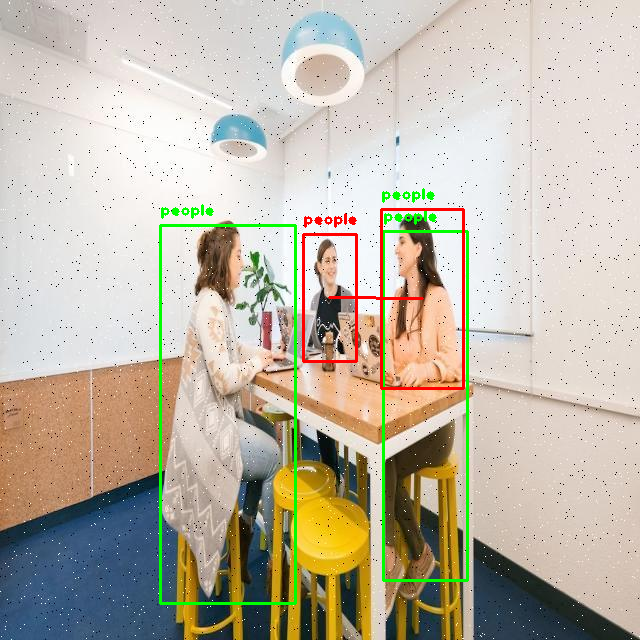

In [ ]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow

# Paths to the files
weights_path = "/content/drive/MyDrive/yolo-coco/yolov3.weights"
config_path = "/content/drive/MyDrive/yolo-coco/yolov3.cfg"
names_path = "/content/drive/MyDrive/yolo-coco/coco.names"

# Check if files exist
if not os.path.isfile(weights_path):
    raise FileNotFoundError(f"YOLO weights file not found: {weights_path}")
if not os.path.isfile(config_path):
    raise FileNotFoundError(f"YOLO config file not found: {config_path}")
if not os.path.isfile(names_path):
    raise FileNotFoundError(f"COCO names file not found: {names_path}")

# Load YOLO
try:
    net = cv2.dnn.readNet(weights_path, config_path)
    print("YOLO model loaded successfully")
except cv2.error as e:
    print(f"Error loading YOLO: {e}")
    raise

layer_names = net.getLayerNames()
unconnected_layers = net.getUnconnectedOutLayers()
print(f"Unconnected layers: {unconnected_layers}")

# Ensure the unconnected_layers are correctly accessed
if len(unconnected_layers) > 0 and isinstance(unconnected_layers[0], (list, np.ndarray)):
    output_layers = [layer_names[i[0] - 1] for i in unconnected_layers]
else:
    output_layers = [layer_names[i - 1] for i in unconnected_layers]

print(f"Output layers: {output_layers}")

# Load class names
classes = []
try:
    with open(names_path, "r") as f:
        classes = [line.strip() for line in f.readlines()]
except FileNotFoundError:
    print("Error: coco.names file not found.")
    raise

# Load the image
image_path = "/content/drive/MyDrive/Dataset/People-detection-2/People-detection-2/train/-Blvd-Antonio-l-Rodriguez-188-Conference-Room-Member-Engagement-1-1440x810_jpg.rf.34de6ba6953e81529adb09911e57c60d.jpg"
try:
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError("Image not found or unable to open.")
except Exception as e:
    print(f"Error loading image: {e}")
    raise

height, width, channels = image.shape

# Detecting objects
blob = cv2.dnn.blobFromImage(image, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
net.setInput(blob)
outs = net.forward(output_layers)

# Information to show on screen
class_ids = []
confidences = []
boxes = []
people_boxes = []

# Loop over each detection
for out in outs:
    for detection in out:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]
        if confidence > 0.5 and class_id == 0:  # Only consider 'person' class
            # Object detected
            center_x = int(detection[0] * width)
            center_y = int(detection[1] * height)
            w = int(detection[2] * width)
            h = int(detection[3] * height)

            # Rectangle coordinates
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)

            boxes.append([x, y, w, h])
            confidences.append(float(confidence))
            class_ids.append(class_id)
            people_boxes.append((x, y, x + w, y + h))

# Apply non-max suppression
indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

# Function to calculate the Euclidean distance
def calculate_distance(box1, box2):
    center1 = ((box1[0] + box1[2]) / 2, (box1[1] + box1[3]) / 2)
    center2 = ((box2[0] + box2[2]) / 2, (box2[1] + box2[3]) / 2)
    distance = np.sqrt((center1[0] - center2[0]) ** 2 + (center1[1] - center2[1]) ** 2)
    return distance

# Check distances between people and draw bounding boxes
safe_distance = 100  # Safe distance in pixels
close_pairs = []  # List to hold pairs of indices that are too close

font = cv2.FONT_HERSHEY_PLAIN
for i in range(len(boxes)):
    if i in indexes:
        x, y, w, h = boxes[i]
        label = str(classes[class_ids[i]])
        color = (0, 255, 0)  # Green color for safe individuals
        for j in range(i + 1, len(boxes)):
            if j in indexes:
                if calculate_distance(people_boxes[i], people_boxes[j]) < safe_distance:
                    close_pairs.append((i, j))
                    color = (0, 0, 255)  # Red color for close individuals
        cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
        cv2.putText(image, label, (x, y - 10), font, 1, color, 2)

# Draw red bounding boxes around individuals who are too close
for (i, j) in close_pairs:
    if i in indexes and j in indexes:
        x1, y1, w1, h1 = boxes[i]
        x2, y2, w2, h2 = boxes[j]
        cv2.rectangle(image, (x1, y1), (x1 + w1, y1 + h1), (0, 0, 255), 2)
        cv2.rectangle(image, (x2, y2), (x2 + w2, y2 + h2), (0, 0, 255), 2)
        cv2.line(image, ((x1 + x1 + w1) // 2, (y1 + y1 + h1) // 2), ((x2 + x2 + w2) // 2, (y2 + y2 + h2) // 2), (0, 0, 255), 2)

# Display the output
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()




YOLO model loaded successfully
Unconnected layers: [200 227 254]
Output layers: ['yolo_82', 'yolo_94', 'yolo_106']


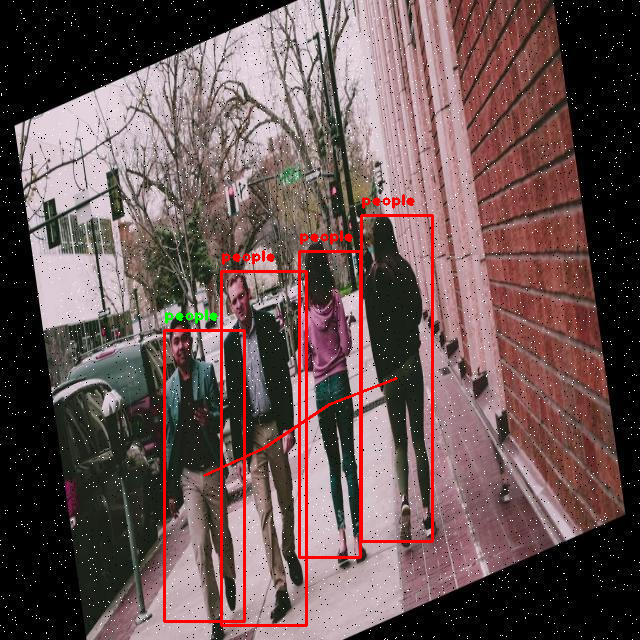

In [ ]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow

# Paths to the files
weights_path = "/content/drive/MyDrive/yolo-coco/yolov3.weights"
config_path = "/content/drive/MyDrive/yolo-coco/yolov3.cfg"
names_path = "/content/drive/MyDrive/yolo-coco/coco.names"

# Check if files exist
if not os.path.isfile(weights_path):
    raise FileNotFoundError(f"YOLO weights file not found: {weights_path}")
if not os.path.isfile(config_path):
    raise FileNotFoundError(f"YOLO config file not found: {config_path}")
if not os.path.isfile(names_path):
    raise FileNotFoundError(f"COCO names file not found: {names_path}")

# Load YOLO
try:
    net = cv2.dnn.readNet(weights_path, config_path)
    print("YOLO model loaded successfully")
except cv2.error as e:
    print(f"Error loading YOLO: {e}")
    raise

layer_names = net.getLayerNames()
unconnected_layers = net.getUnconnectedOutLayers()
print(f"Unconnected layers: {unconnected_layers}")

# Ensure the unconnected_layers are correctly accessed
if len(unconnected_layers) > 0 and isinstance(unconnected_layers[0], (list, np.ndarray)):
    output_layers = [layer_names[i[0] - 1] for i in unconnected_layers]
else:
    output_layers = [layer_names[i - 1] for i in unconnected_layers]

print(f"Output layers: {output_layers}")

# Load class names
classes = []
try:
    with open(names_path, "r") as f:
        classes = [line.strip() for line in f.readlines()]
except FileNotFoundError:
    print("Error: coco.names file not found.")
    raise

# Load the image
image_path = "/content/drive/MyDrive/Dataset/People-detection-2/People-detection-2/train/-_13_jpeg_jpg.rf.6c6687846387e0261604ed075cfd6d10.jpg"
try:
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError("Image not found or unable to open.")
except Exception as e:
    print(f"Error loading image: {e}")
    raise

height, width, channels = image.shape

# Detecting objects
blob = cv2.dnn.blobFromImage(image, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
net.setInput(blob)
outs = net.forward(output_layers)

# Information to show on screen
class_ids = []
confidences = []
boxes = []
people_boxes = []

# Loop over each detection
for out in outs:
    for detection in out:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]
        if confidence > 0.5 and class_id == 0:  # Only consider 'person' class
            # Object detected
            center_x = int(detection[0] * width)
            center_y = int(detection[1] * height)
            w = int(detection[2] * width)
            h = int(detection[3] * height)

            # Rectangle coordinates
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)

            boxes.append([x, y, w, h])
            confidences.append(float(confidence))
            class_ids.append(class_id)
            people_boxes.append((x, y, x + w, y + h))

# Apply non-max suppression
indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

# Function to calculate the Euclidean distance
def calculate_distance(box1, box2):
    center1 = ((box1[0] + box1[2]) / 2, (box1[1] + box1[3]) / 2)
    center2 = ((box2[0] + box2[2]) / 2, (box2[1] + box2[3]) / 2)
    distance = np.sqrt((center1[0] - center2[0]) ** 2 + (center1[1] - center2[1]) ** 2)
    return distance

# Check distances between people and draw bounding boxes
safe_distance = 100  # Safe distance in pixels
close_pairs = []  # List to hold pairs of indices that are too close

font = cv2.FONT_HERSHEY_PLAIN
for i in range(len(boxes)):
    if i in indexes:
        x, y, w, h = boxes[i]
        label = str(classes[class_ids[i]])
        color = (0, 255, 0)  # Green color for safe individuals
        for j in range(i + 1, len(boxes)):
            if j in indexes:
                if calculate_distance(people_boxes[i], people_boxes[j]) < safe_distance:
                    close_pairs.append((i, j))
                    color = (0, 0, 255)  # Red color for close individuals
        cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
        cv2.putText(image, label, (x, y - 10), font, 1, color, 2)

# Draw red bounding boxes around individuals who are too close
for (i, j) in close_pairs:
    if i in indexes and j in indexes:
        x1, y1, w1, h1 = boxes[i]
        x2, y2, w2, h2 = boxes[j]
        cv2.rectangle(image, (x1, y1), (x1 + w1, y1 + h1), (0, 0, 255), 2)
        cv2.rectangle(image, (x2, y2), (x2 + w2, y2 + h2), (0, 0, 255), 2)
        cv2.line(image, ((x1 + x1 + w1) // 2, (y1 + y1 + h1) // 2), ((x2 + x2 + w2) // 2, (y2 + y2 + h2) // 2), (0, 0, 255), 2)

# Display the output
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()




**Dataset Download**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Drdnh4xoP49n0zc1hA6c")
project = rf.workspace("mackenzie").project("people-detection-hpqvt")
version = project.version(2)
dataset = version.download("darknet")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to People-detection-2 in darknet:: 100%|██████████| 11664/11664 [00:04<00:00, 2637.28it/s]


**Training loss**

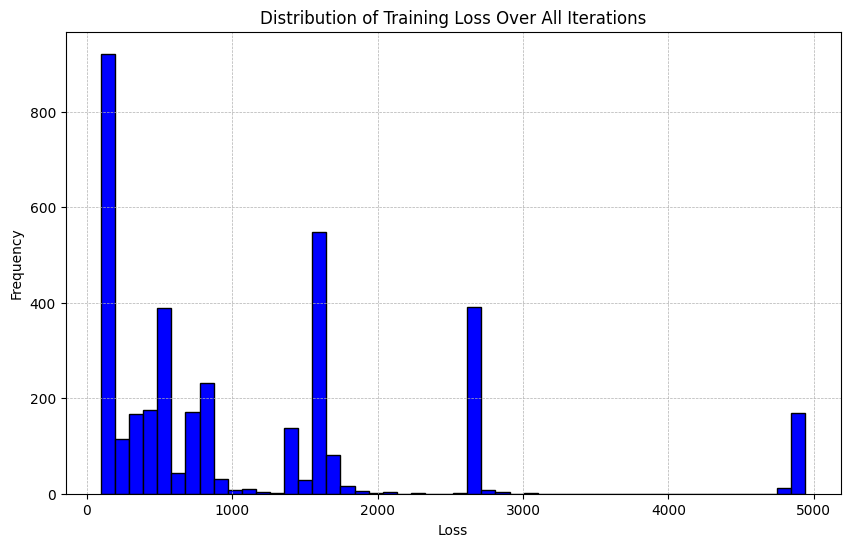

In [ ]:
import matplotlib.pyplot as plt
import re

with open('/content/drive/MyDrive/log_file.log', 'r') as file:
    log_data = file.read()

total_loss_pattern = re.compile(r'total_loss = (\d+\.\d+)')
total_loss_values = [float(m.group(1)) for m in total_loss_pattern.finditer(log_data)]

plt.figure(figsize=(10, 6))
plt.hist(total_loss_values, bins=50, color='blue', edgecolor='black')

plt.xlabel('Loss')
plt.ylabel('Frequency')
plt.title('Distribution of Training Loss Over All Iterations')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.show()


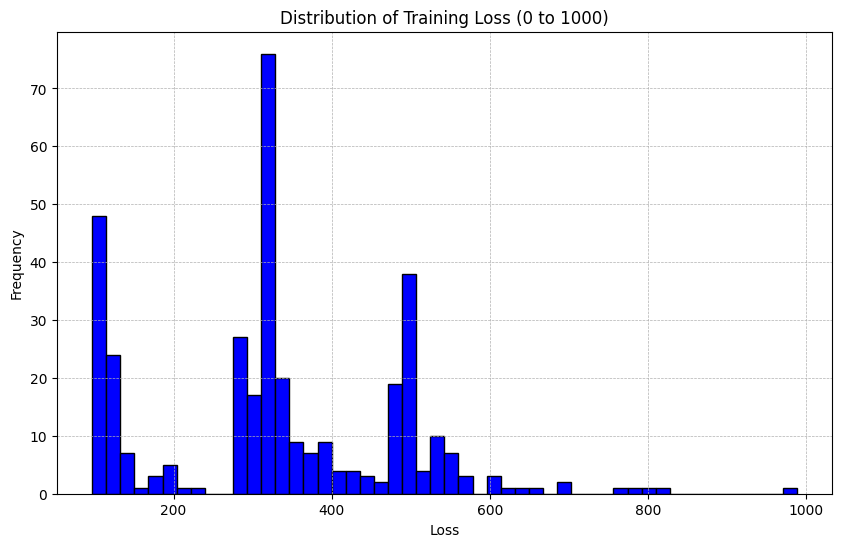

In [ ]:
import matplotlib.pyplot as plt
import re

with open('/content/drive/MyDrive/log_file_1000.log', 'r') as file:
    log_data = file.read()

total_loss_pattern = re.compile(r'total_loss = (\d+\.\d+)')
total_loss_values = [float(m.group(1)) for m in total_loss_pattern.finditer(log_data)]

filtered_loss_values = [value for value in total_loss_values if 0 <= value <= 1000]

plt.figure(figsize=(10, 6))
plt.hist(filtered_loss_values, bins=50, color='blue', edgecolor='black')

plt.xlabel('Loss')
plt.ylabel('Frequency')
plt.title('Distribution of Training Loss (0 to 1000)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.show()
